#До использования baseline

Прежде чем запускать код вам нужно будет получить два файла signal.dat

(они уже есть в репозитории, но полезно будет посмотреть как их получать)

Это краткая версия руководства, представленного в файле "Пояснения"

![](https://sun9-76.userapi.com/impg/XuSMVFguWJ3aRSnA2T2wDtMBkVMSYZslM25f5w/lZgjywBATUA.jpg?size=1920x1080&quality=96&sign=29ae32e61556d494f2184fea990bd06f&type=album)

![](https://sun9-45.userapi.com/impg/-MJITKqRKgBKyiVFYCVZSpX3N_YC8Mp-T_8n0A/DDRBiCDZkco.jpg?size=1920x1080&quality=96&sign=460609ac3ed664af120d49c6822cde75&type=album)

![](https://sun9-12.userapi.com/impg/Tkvkx3owH_18M6ORK4d9yu1L4hsj8xN3Mt1szg/aXTgcFIsmPE.jpg?size=1920x1080&quality=96&sign=3156a69959a2a39b47709e8718820b21&type=album)

![](https://sun9-64.userapi.com/impg/qmnnJIRvrHbJ1K_46IOaYXUDFsPmBQNWEfwK1Q/dppfhpUvzoQ.jpg?size=1920x1080&quality=96&sign=4610793cf2d599c7f04a7907988b29b5&type=album)

#Загрузка данных

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import time
import pandas as pd
import re

In [ ]:
analise_duration_start=time.time()

In [ ]:
#чтение сигналов из файла
def read_file_to_signal(filename):
    with open(filename, 'r') as file:
        lines = file.readlines()

    signal = [list(map(float, line.strip().split())) for line in lines]

    return np.array(signal)

filename_channal_signal = '/content/signal_16.dat'
filename_hypnogram_signal = '/content/signal_16_g.dat'

signal = read_file_to_signal(filename_channal_signal)
signal_g = read_file_to_signal(filename_hypnogram_signal)


In [ ]:
print(f'Кол-во наблюдений в файле {filename_channal_signal} : {len(signal)}')
print(f'Кол-во наблюдений в файле {filename_hypnogram_signal} : {len(signal_g)}')

Кол-во наблюдений в файле /content/signal_16.dat : 359999
Кол-во наблюдений в файле /content/signal_16_g.dat : 599


Text(0, 0.5, 'Значение')

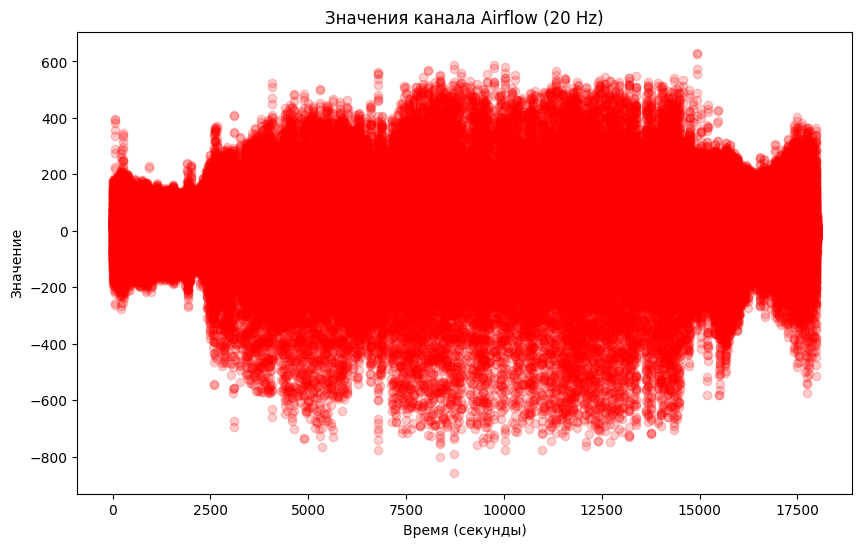

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(signal[:,0], signal[:,1], alpha=0.2, color='red')

plt.title('Значения канала Airflow (20 Hz)')
plt.xlabel('Время (секунды)')
plt.ylabel('Значение')

Text(0, 0.5, 'Значение')

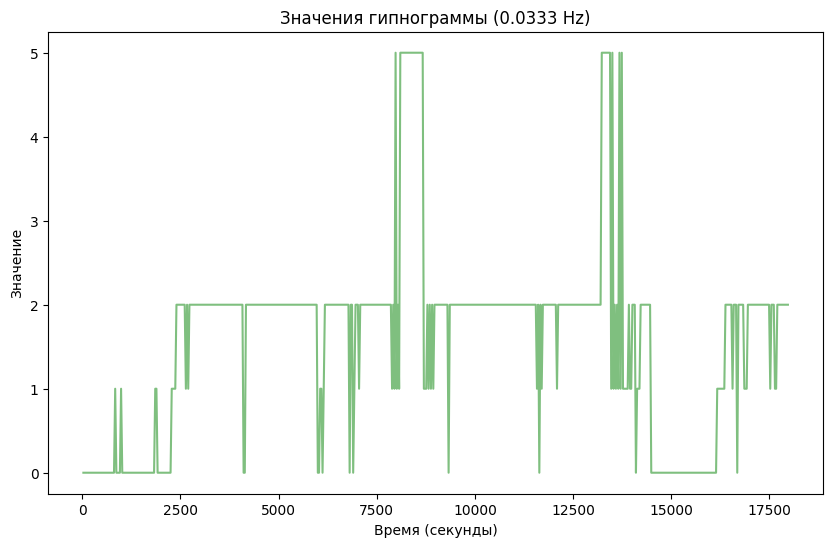

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(signal_g[:,0], signal_g[:,1], alpha=0.5, color='green')

plt.title('Значения гипнограммы (0.0333 Hz)')
plt.xlabel('Время (секунды)')
plt.ylabel('Значение')

#Работа с сигналами

##Дискретизация сигнала

Возможно вам потребуется перевести сигнал с большей частоты в меньшую  для уменьшения кол-ва наблюдений в секунду. Создадим для этого функцию

In [ ]:
def discretize(signal, signal_fr, disc_fr):
  if disc_fr > signal_fr: raise ValueError('частоты можно переводить только из большей в меньшую')

  step = signal_fr//disc_fr
  return signal[::step]

In [ ]:
#@title Дискретизация сигнала

#Частота сигнала в Hz
signal_frequency = 20 #@param {type:"integer"}

#Желаемая частота в Hz
disc_signal_frequency = 20 #@param {type:"integer"}

In [ ]:
# переводим наш сигнал на другую частоту (в данном случае я не меняю частоту, а оставляю такую же)
desc_signal = discretize(signal, signal_frequency, disc_signal_frequency)

Text(0, 0.5, 'Значение')

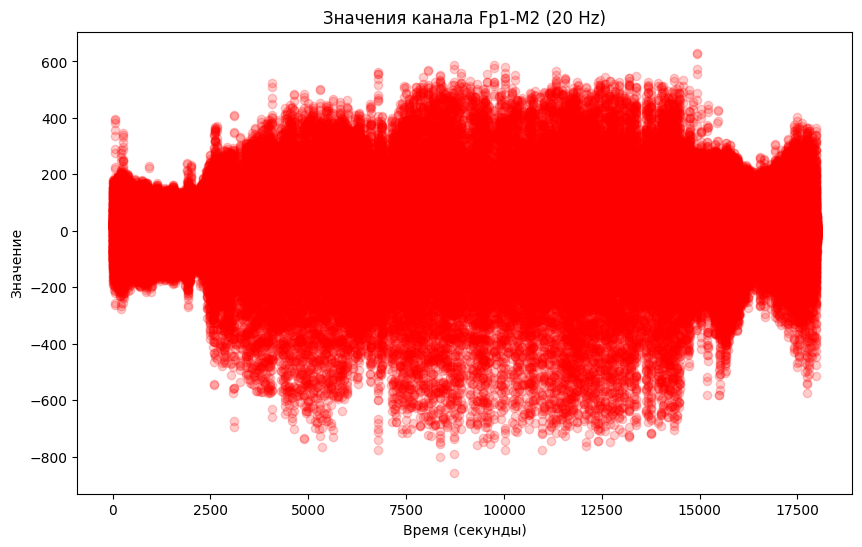

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(desc_signal[:,0], desc_signal[:,1], alpha=0.2, color='red')

plt.title(f'Значения канала Fp1-M2 ({disc_signal_frequency} Hz)')
plt.xlabel('Время (секунды)')
plt.ylabel('Значение')

##Реконструкция сигнала

Бывают случаи когда мы захотим перевести сигнал с меньшей частотой в большую

Рассмотрим пример, где сигнал гипипнограммы сна с частотой 0.333 Hz будем переводить в 20 Hz

In [ ]:
#Исходная частота
signal_g_frequency = 0.0333


Чистая длина реконструированного сигнала : 359400
Исправленная длина реконструированного сигнала : 359999


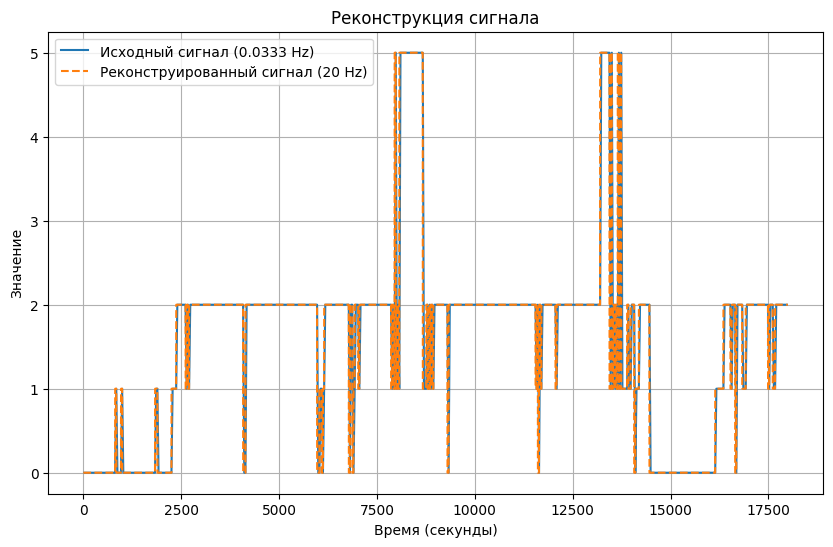

In [ ]:
#Фунция для реконструкции сигнал.
#При дробной частоте мы не сможем восстановить сигнал идеально, поэтому прибегнем к уловке и будем сравнивать кол-во точек данных после реконструкции с другим сигналом той же частоты
def signal_reconstruction(from_signal, to_signal, from_frequency, to_frequency, plot=False):
  if from_frequency > to_frequency: raise ValueError('частоты можно переводить только из меньшую в большую')

  #сигнал для сравнения
  obs_num=len(to_signal)

  time = from_signal[:,0]
  source_signal = from_signal[:,1]

  # Увеличение частоты сигнала
  resampled_signal = np.array(np.repeat(source_signal, (to_frequency // from_frequency)))

  print(f'Чистая длина реконструированного сигнала : {len(resampled_signal)}')

  # resampled_signal по количеству наблюдений (заполняем или обрезаем resampled_signal до длины obs_num)
  resampled_signal = np.concatenate([resampled_signal, [source_signal[-1]]*(obs_num-len(resampled_signal[:obs_num]))])

  print(f'Исправленная длина реконструированного сигнала : {len(resampled_signal)}')


  if plot:
    # Визуализация исходного и реконструированного сигнала
    plt.figure(figsize=(10, 6))
    plt.plot(time, source_signal, label=f'Исходный сигнал ({from_frequency} Hz)')
    plt.plot(to_signal[:,0], resampled_signal, label=f'Реконструированный сигнал ({to_frequency} Hz)', linestyle='--')
    plt.xlabel('Время (секунды)')
    plt.ylabel('Значение')
    plt.title('Реконструкция сигнала')
    plt.legend()
    plt.grid(True)
    plt.show()

  return resampled_signal

resampled_signal=signal_reconstruction(signal_g, desc_signal, signal_g_frequency, disc_signal_frequency, plot=True)

#Преобразование данных

##Добавление фазы сна

Добавляем реконструированный сигнал из гипнограммы сна к дескритизированному сигналу канала Airflow

In [ ]:
#добавление фазы сна в набор данных
resampled_signal=resampled_signal.reshape([len(resampled_signal),1])
desc_signal=np.concatenate([desc_signal,resampled_signal], axis=1)

##Нарезка сигнала на части

Делим весь сигнал на непересекающиеся временные окна заданного размера

In [ ]:
window_size_sec=50 #кол-во секунд на одно окно

window_size = window_size_sec*disc_signal_frequency

In [ ]:
def slice_signal(signal,window_size):
  signal_parts=[]
  for i in range(len(signal)//window_size):
    signal_parts.append(signal[i*window_size:(i*window_size)+window_size])
  #signal_parts.append(signal[(i*window_size)+window_size:]) добавление недостающих элементов (если число наблюдений ровно не делится на window_size)

  signal_parts = np.array(signal_parts)
  return signal_parts

In [ ]:
signal_parts=slice_signal(desc_signal, window_size)
print(f'Получилось {signal_parts.shape[0]} фрагмента с {signal_parts.shape[1]} наблюдениями')

Получилось 359 фрагмента с 1000 наблюдениями


#Выявление синдрома

В этом блокноте алгоритм выявления синдрома строится на использовании мер центральной тенденции:

* Если человек здоров, то его дыхание имеет одинаковую амплитуду в ближайших
окресностях.

* Если человек болен, то амплитуда его дыхания будет постоянно менятся (проявление синдрома, затем гипервентиляция)

Для отслеживания таких изменений будем использовать среднее значение и медиану, предварительно взяв данные по абсолютному значению (модулю).

In [ ]:
def analise_parts(signal_parts, threshold, plot=False):
  with_syndrome=[]
  without_syndrome=[]


  for part_numder in range(len(signal_parts)):

    mean=np.mean(np.abs(signal_parts[part_numder][:,1]))
    median=np.median(np.abs(signal_parts[part_numder][:,1]))


    if median/mean < threshold:
      with_syndrome.append(signal_parts[part_numder])
    else:
      without_syndrome.append(signal_parts[part_numder])


    if plot:
      plt.title(part_numder)
      plt.scatter(signal_parts[part_numder][:,0], signal_parts[part_numder][:,1], alpha=0.2, color='red')
      plt.show()
      print(f"Среднее значение {mean}")
      print(f"Медиана {median}")
      print(f"Наличие синдрома : {median/mean < threshold}")

  return [with_syndrome,without_syndrome]



In [ ]:
#берет часть сигнала по индексу
def get_part(signal_parts,part_numder):

  plt.scatter(signal_parts[part_numder][:,0], signal_parts[part_numder][:,1], alpha=0.2, color='red')
  plt.show()
  print(f"Среднее значение {np.mean(np.abs(signal_parts[part_numder][:,1]))}")
  print(f"Медиана {np.median(np.abs(signal_parts[part_numder][:,1]))}")



Будем счиатать часть сигнала проявлением синдрома только в том случае, если среднее значение больше медианы на 60%

In [ ]:
with_syndrome,without_syndrome=analise_parts(signal_parts, threshold=0.6, plot=False)

In [ ]:
#Визуализируем фрагменты с проявлением синдрома и без
def visualizate_signals(signal_parts, ncols=4):
    nrows=len(signal_parts)//ncols

    width_per_graph = 5
    height_per_graph = 4
    fig_width = ncols * width_per_graph
    fig_height = nrows * height_per_graph

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_width, fig_height))

    for r in range(nrows):
      for c in range(ncols):
        axes[r, c].scatter(signal_parts[r*ncols+c][:,0],signal_parts[r*ncols+c][:,1])
        axes[r, c].set_title(f'Часть сигнала {signal_parts[r*ncols+c][:,0][0]} - {signal_parts[r*ncols+c][:,0][-1]} с')


    # Отображение графиков
    plt.tight_layout()
    plt.show()


Фрагменты с проявлением синдрома

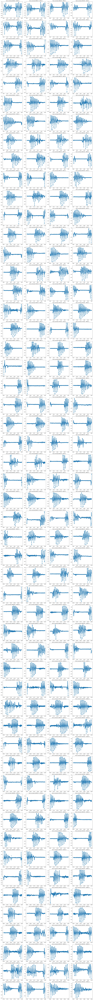

In [ ]:
visualizate_signals(with_syndrome, ncols=4)

Фрагменты без проявлением синдрома

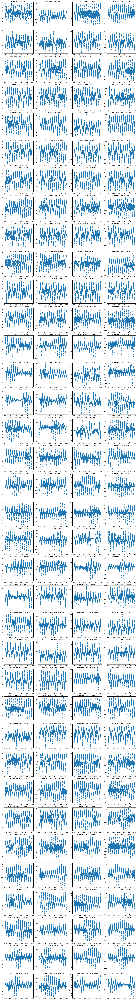

In [ ]:
visualizate_signals(without_syndrome, ncols=4)

In [ ]:
analise_duration_end=time.time()

#Составление отчета

##Подсчет значений

**Технический отчет**

In [ ]:
PSG_duration=(signal[:,0][-1]-signal[:,0][0])//60
signal_types=['airflow']
analise_duration=int(analise_duration_end-analise_duration_start)
presence_of_syndrome=len(with_syndrome)>0

In [ ]:
report_part1=f"""
Отчет для врача … по полисомнографической записи …
Технический отчет
Проведен анализ ПСГ длительностью {PSG_duration} минут
Оценивались сигналы типа  [{', '.join(signal_types)}]
Время обработки составило {analise_duration} секунд
Клинический отчет
По результатам анализа выявлено {'наличие' if presence_of_syndrome else 'отсутствие'} признаков нарушений дыхания во сне

"""

In [ ]:
print(report_part1)


Отчет для врача … по полисомнографической записи …
Технический отчет
Проведен анализ ПСГ длительностью 299.0 минут
Оценивались сигналы типа  [airflow]
Время обработки составило 90 секунд
Клинический отчет
По результатам анализа выявлено наличие признаков нарушений дыхания во сне




**Клинический отчет**

In [ ]:
data = {
    '# эпизода НРД': [x+1 for x in range(len(with_syndrome))],
    'Время начала регистрации эпизода НРД, с': [x[:,0][0] for x in with_syndrome],
    'Время завершения регистрации НРД, с': [x[:,0][-1] for x in with_syndrome],
    'Длительность эпизода НДР': [x[:,0][-1]-x[:,0][0] for x in with_syndrome],
    'Тип эпизода НРД*': ['обструктивное апноэ']*len(with_syndrome)
}

In [ ]:
report_df=pd.DataFrame(data)
report_df.set_index('# эпизода НРД', inplace=True)

In [ ]:
report_df

,"Время начала регистрации эпизода НРД, с","Время завершения регистрации НРД, с",Длительность эпизода НДР,Тип эпизода НРД*
# эпизода НРД,,,,
1,2800.05,2850.0,49.95,обструктивное апноэ
2,2900.05,2950.0,49.95,обструктивное апноэ
3,3000.05,3050.0,49.95,обструктивное апноэ
4,3050.05,3100.0,49.95,обструктивное апноэ
5,3100.05,3150.0,49.95,обструктивное апноэ
...,...,...,...,...
209,17700.05,17750.0,49.95,обструктивное апноэ
210,17750.05,17800.0,49.95,обструктивное апноэ
211,17800.05,17850.0,49.95,обструктивное апноэ


**Характеристика длительности эпизодов нарушения дыхания**

In [ ]:
#Добавляем немного шума т.к в baseline есть только одно значение длительность эпизода НДР
report_df['Длительность эпизода НДР']=report_df['Длительность эпизода НДР']+np.random.randn(len(report_df))

<Axes: >

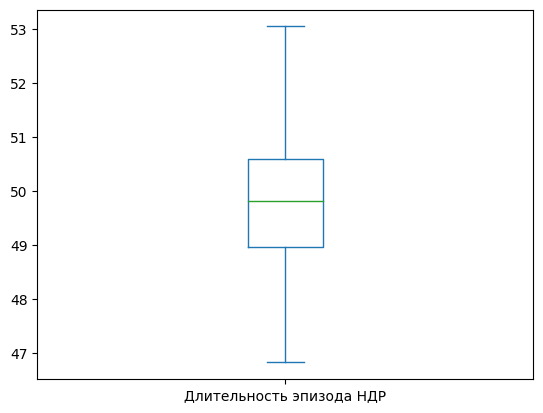

In [ ]:
report_df['Длительность эпизода НДР'].plot.box()

In [ ]:
report_part2=f"""
Средняя длительность – {np.round(report_df['Длительность эпизода НДР'].mean(),2)} секунд
Медиана длительности НРД -- {np.round(report_df['Длительность эпизода НДР'].median(),2)} секунд
Разброс длительности НРД -- от {np.round(report_df['Длительность эпизода НДР'].min(),2)} секунд до {np.round(report_df['Длительность эпизода НДР'].max(),2)} секунд

"""

In [ ]:
print(report_part2)


Средняя длительность – 49.81 секунд
Медиана длительности НРД -- 49.82 секунд
Разброс длительности НРД -- от 46.82 секунд до 53.05 секунд




**Анализ эпизодов нарушения дыхания в зависимости от времени регистрации**

Для заполнения этого пункта потребуеются txt файл с метаданными, полученный после шага 2, вместе с N.ascii

In [ ]:
file_path='/content/N-1.txt'
def read_metadata_txt(file_path):
  with open(file_path, 'r', encoding='latin1') as file:
      data = file.readlines()

      parsed_data = {}

      for_find = ["StartTime","StopTime"]
      time_pattern = r"\b\d{2}\.\d{2}\.\d{2}\b"


      for line in data:
          for f in for_find:
              if f in line:
                  # Поиск времени в строке
                  match = re.search(time_pattern, line)

                  if match:
                    parsed_data[f]=match.group()

                  else:
                    raise ValueError(f"В файле не обнаружено значение времени для {f}")

      return parsed_data

In [ ]:
def to_sec(time_HMS):
  hours, minutes, seconds = map(int, time_HMS.split('.'))
  total_seconds = (hours * 3600) + (minutes * 60) + seconds
  return total_seconds

In [ ]:
data = read_metadata_txt(file_path)

In [ ]:
data

{'StartTime': '23.44.00', 'StopTime': '07.45.00'}

In [ ]:
StartTime=to_sec(data['StartTime'])
StopTime=to_sec(data['StopTime'])
if StopTime<StartTime:
  sleep_time = to_sec('24.00.00') - StartTime + StopTime
else:
  sleep_time = StartTime - StopTime


In [ ]:
print(f'Всего пациент спал {sleep_time} секунд')

Всего пациент спал 28860 секунд


In [ ]:
def sleep_part(x, sleep_time=sleep_time):
  if x<sleep_time/3:
    return '1 треть сна'
  elif (x>=sleep_time/3 and x<2*sleep_time/3):
    return '2 треть сна'
  else:
    return '3 треть сна'


In [ ]:
sleep_parts = report_df['Время завершения регистрации НРД, с'].apply(sleep_part)

In [ ]:
sleep_parts.value_counts()

Время завершения регистрации НРД, с
1 треть сна    108
2 треть сна    105
Name: count, dtype: int64

Text(0.5, 1.0, 'Распределение эпизодов НРД по первой, второй и последней третях ночного сна')

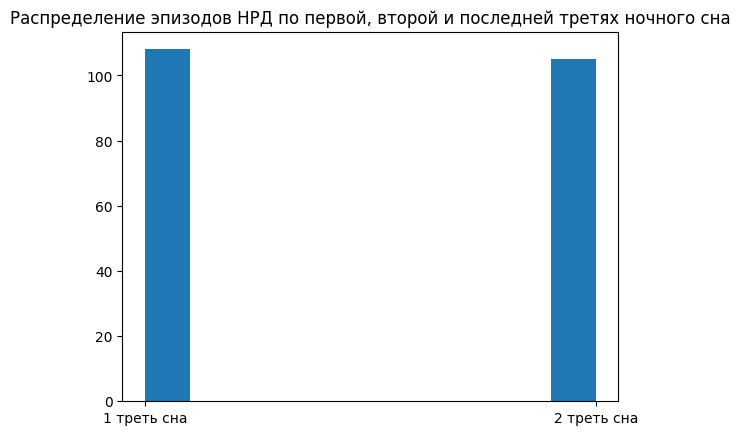

In [ ]:
plt.hist(sleep_parts)
plt.title('Распределение эпизодов НРД по первой, второй и последней третях ночного сна')

##Отображение

Технический отчет

In [ ]:
print(report_part1)


Отчет для врача … по полисомнографической записи …
Технический отчет
Проведен анализ ПСГ длительностью 299.0 минут
Оценивались сигналы типа  [airflow]
Время обработки составило 90 секунд
Клинический отчет
По результатам анализа выявлено наличие признаков нарушений дыхания во сне




Клинический отчет

In [ ]:
report_df

,"Время начала регистрации эпизода НРД, с","Время завершения регистрации НРД, с",Длительность эпизода НДР,Тип эпизода НРД*
# эпизода НРД,,,,
1,2800.05,2850.0,50.225442,обструктивное апноэ
2,2900.05,2950.0,48.844706,обструктивное апноэ
3,3000.05,3050.0,49.223676,обструктивное апноэ
4,3050.05,3100.0,49.690484,обструктивное апноэ
5,3100.05,3150.0,48.480150,обструктивное апноэ
...,...,...,...,...
209,17700.05,17750.0,49.318493,обструктивное апноэ
210,17750.05,17800.0,49.112845,обструктивное апноэ
211,17800.05,17850.0,50.680508,обструктивное апноэ


Характеристика длительности эпизодов нарушения дыхания

<Axes: >

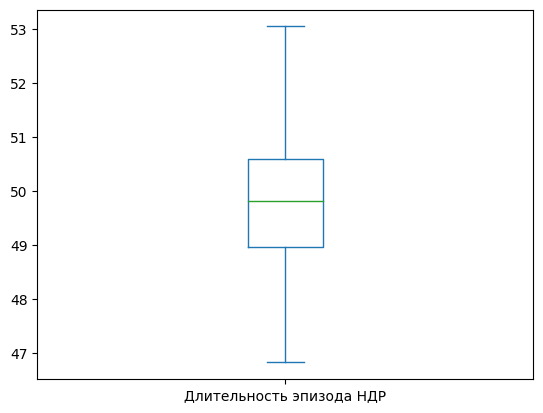

In [ ]:
report_df['Длительность эпизода НДР'].plot.box()

In [ ]:
print(report_part2)


Средняя длительность – 49.81 секунд
Медиана длительности НРД -- 49.82 секунд
Разброс длительности НРД -- от 46.82 секунд до 53.05 секунд




Анализ эпизодов нарушения дыхания в зависимости от времени регистрации

Text(0.5, 1.0, 'Распределение эпизодов НРД по первой, второй и последней третях ночного сна')

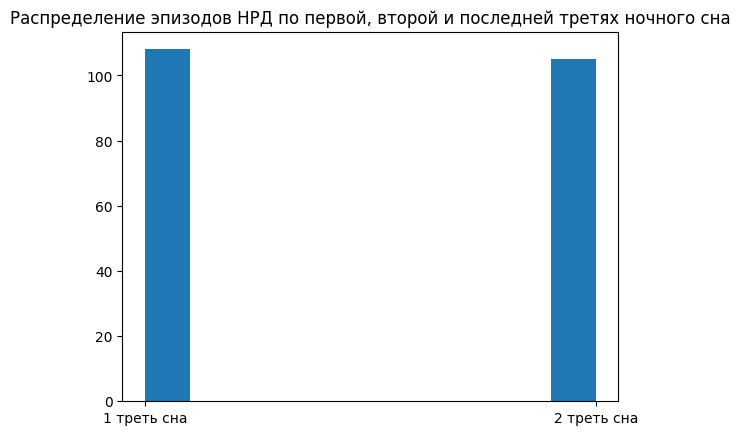

In [ ]:
plt.hist(sleep_parts)
plt.title('Распределение эпизодов НРД по первой, второй и последней третях ночного сна')